# `EmissionPhysicalModel` Tutorial

Trey V. Wenger (c) July 2025

`EmissionPhysicalModel` is a re-parameterization of `EmissionModel` that places more physically motivated constraints on the parameter space.

In [1]:
# General imports    
import time

import matplotlib.pyplot as plt
import arviz as az
import pandas as pd
import numpy as np
import pymc as pm

print("pymc version:", pm.__version__)
print("arviz version:", az.__version__)

import bayes_spec
print("bayes_spec version:", bayes_spec.__version__)

import caribou_hi
print("caribou_hi version:", caribou_hi.__version__)

# Notebook configuration
pd.options.display.max_rows = None

pymc version: 5.22.0
arviz version: 0.22.0dev
bayes_spec version: 1.8.0+1.g1cab589
caribou_hi version: 3.0.0+2.g11db344.dirty


## Simulating Data

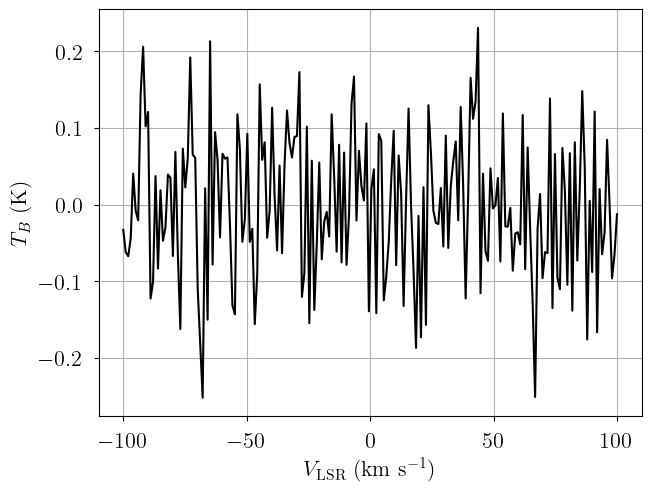

In [2]:
from bayes_spec import SpecData

# spectral axes definition
velo_axis = np.linspace(-100.0, 100.0, 200) # km s-1

# data noise can either be a scalar (assumed constant noise across the spectrum)
# or an array of the same length as the data
rms = 0.1 # K

# brightness data. In this case, we just throw in some random data for now
# since we are only doing this in order to simulate some actual data.
emission = rms * np.random.randn(len(velo_axis))

dummy_data = {"emission": SpecData(
    velo_axis,
    emission,
    rms,
    xlabel=r"$V_{\rm LSR}$ (km s$^{-1}$)",
    ylabel=r"$T_B$ (K)",
)}

# Plot dummy data
fig, ax = plt.subplots(layout="constrained")
ax.plot(dummy_data["emission"].spectral, dummy_data["emission"].brightness, "k-")
ax.set_xlabel(dummy_data["emission"].xlabel)
_ = ax.set_ylabel(dummy_data["emission"].ylabel)

In [3]:
from caribou_hi import EmissionPhysicalModel

# Initialize and define the model
n_clouds = 3
baseline_degree = 0
model = EmissionPhysicalModel(
    dummy_data,
    n_clouds=n_clouds,
    baseline_degree=baseline_degree,
    depth_nth_fwhm_power = 1/3, # assumed non-thermal FWHM vs. depth power law index
    bg_temp = 3.77, # assumed background temperature (K)
    seed=1234,
    verbose=True,
)
model.add_priors(
    prior_ff_NHI=1.0e21,  # filling factor * column density prior width (cm-2)
    prior_fwhm2=200.0, # FWHM^2 prior width (km2 s-2)
    prior_fwhm2_thermal_fraction=[2.0, 2.0], # thermal FWHM^2 fraction prior shape
    prior_velocity=[-20.0, 20.0],  # lower and upper limit of velocity prior (km/s)
    prior_n_alpha=1.0e-6,  # n_alpha prior width (cm-3)
    prior_nth_fwhm_1pc=[1.75, 0.25], # non-thermal FWHM at 1 pc prior mean and width (km s-1)
    prior_fwhm_L=None, # Assume Gaussian line profile
    prior_baseline_coeffs=None, # Default baseline priors
)
model.add_likelihood()

In [4]:
from caribou_hi import physics

# Simulation parameters
filling_factor = np.array([0.2, 0.8, 1.0])
log10_nHI = np.array([1.25, 0.0, -0.5])
tkin = np.array([50.0, 300.0, 5000.0])
n_alpha = np.array([1.0e-6, 2.0e-6, 3.0e-6])
depth = np.array([5.0, 25.0, 300.0])
nth_fwhm_1pc = np.array([1.25, 1.75, 1.5])

tspin = physics.calc_spin_temp(tkin, 10.0**log10_nHI, n_alpha).eval()
print("tspin", tspin)

fwhm2_nonthermal = physics.calc_nonthermal_fwhm(depth, nth_fwhm_1pc, 1/3)**2.0
print("fwhm2_nonthermal", fwhm2_nonthermal)

fwhm2_thermal = physics.calc_thermal_fwhm2(tkin)
print("fwhm2_thermal", fwhm2_thermal)

fwhm2 = fwhm2_nonthermal + fwhm2_thermal
print("fwhm2", fwhm2)

fwhm2_thermal_fraction = fwhm2_thermal/fwhm2
print("fwhm2_thermal_fraction", fwhm2_thermal_fraction)

log10_Pth = np.log10(tkin) + log10_nHI
print("log10_Pth", log10_Pth)

log10_NHI = log10_nHI + np.log10(depth) + 18.489351
print("log10_NHI", log10_NHI)

tau_total = physics.calc_tau_total(10.0**log10_NHI, tspin)
print("tau_total", tau_total)

sim_params = {
    "filling_factor": filling_factor,
    "log10_NHI": log10_NHI,
    "fwhm2": fwhm2,
    "fwhm2_thermal_fraction": fwhm2_thermal_fraction,
    "velocity": np.array([-5.0, 5.0, 10.0]),
    "n_alpha": n_alpha,
    "nth_fwhm_1pc": nth_fwhm_1pc,
    "baseline_absorption_norm": [0.0],
}

# add derived quantities to sim_params
for key in model.cloud_deterministics:
    if key not in sim_params.keys():
        sim_params[key] = model.model[key].eval(sim_params, on_unused_input="ignore")

# Evaluate and save simulated observation
emission = model.model["emission"].eval(sim_params, on_unused_input="ignore")
data = {"emission": SpecData(
    velo_axis,
    emission,
    rms,
    xlabel=r"$V_{\rm LSR}$ (km s$^{-1}$)",
    ylabel=r"$T_B$ (K)",
)}

tspin [  49.97911226  298.78900835 4259.26982821]
fwhm2_nonthermal [  4.56877772  26.18400668 100.8316068 ]
fwhm2_thermal [  2.2876605  13.725963  228.76605  ]
fwhm2 [  6.85643822  39.90996968 329.5976568 ]
fwhm2_thermal_fraction [0.33365144 0.34392316 0.69407669]
log10_Pth [2.94897    2.47712125 3.19897   ]
log10_NHI [20.438321   19.88729101 20.46647225]
tau_total [3.01218479 0.14166923 0.03771258]


In [5]:
sim_params

{'filling_factor': array([0.2, 0.8, 1. ]),
 'log10_NHI': array([20.438321  , 19.88729101, 20.46647225]),
 'fwhm2': array([  6.85643822,  39.90996968, 329.5976568 ]),
 'fwhm2_thermal_fraction': array([0.33365144, 0.34392316, 0.69407669]),
 'velocity': array([-5.,  5., 10.]),
 'n_alpha': array([1.e-06, 2.e-06, 3.e-06]),
 'nth_fwhm_1pc': array([1.25, 1.75, 1.5 ]),
 'baseline_absorption_norm': [0.0],
 'fwhm2_thermal': array([  2.2876605,  13.725963 , 228.76605  ]),
 'tkin': array([  50.,  300., 5000.]),
 'fwhm2_nonthermal': array([  4.56877772,  26.18400668, 100.8316068 ]),
 'depth': array([  5.,  25., 300.]),
 'log10_nHI': array([ 1.25,  0.  , -0.5 ]),
 'tspin': array([  49.97911226,  298.78900835, 4259.26982821]),
 'tau_total': array([3.01218479, 0.14166923, 0.03771258]),
 'log10_Pth': array([2.94897   , 2.47712125, 3.19897   ]),
 'log10_Pnth': array([4.73704003, 4.2452761 , 4.33083669]),
 'log10_Ptot': array([4.74405782, 4.25262043, 4.36176538])}

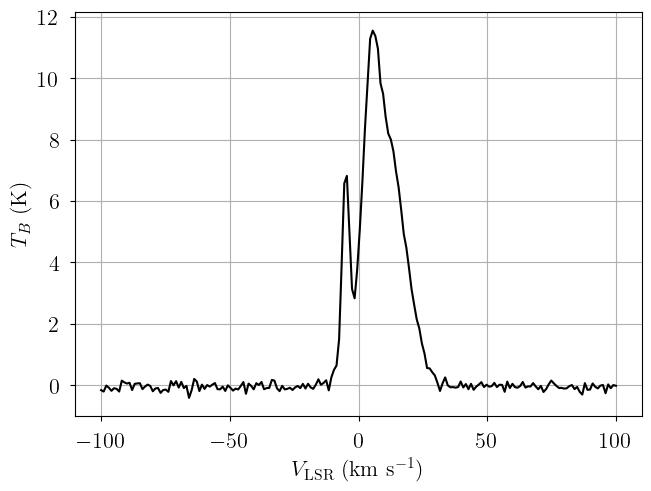

In [6]:
# Plot data
fig, ax = plt.subplots(layout="constrained")
ax.plot(data["emission"].spectral, data["emission"].brightness, "k-")
ax.set_xlabel(data["emission"].xlabel)
_ = ax.set_ylabel(data["emission"].ylabel)

## Model Definition

In [7]:
# Initialize and define the model
model = EmissionPhysicalModel(
    data,
    n_clouds=n_clouds,
    baseline_degree=baseline_degree,
    depth_nth_fwhm_power = 1/3, # assumed non-thermal FWHM vs. depth power law index
    bg_temp = 3.77, # assumed background temperature (K)
    seed=1234,
    verbose=True,
)
model.add_priors(
    prior_ff_NHI=1.0e21,  # filling factor * column density prior width (cm-2)
    prior_fwhm2=200.0, # FWHM^2 prior width (km2 s-2)
    prior_fwhm2_thermal_fraction=[2.0, 2.0], # thermal FWHM^2 fraction prior shape
    prior_velocity=[-20.0, 20.0],  # lower and upper limit of velocity prior (km/s)
    prior_n_alpha=1.0e-6,  # n_alpha prior width (cm-3)
    prior_nth_fwhm_1pc=[1.75, 0.25], # non-thermal FWHM at 1 pc prior mean and width (km s-1)
    prior_fwhm_L=None, # Assume Gaussian line profile
    prior_baseline_coeffs=None, # Default baseline priors
)
model.add_likelihood()

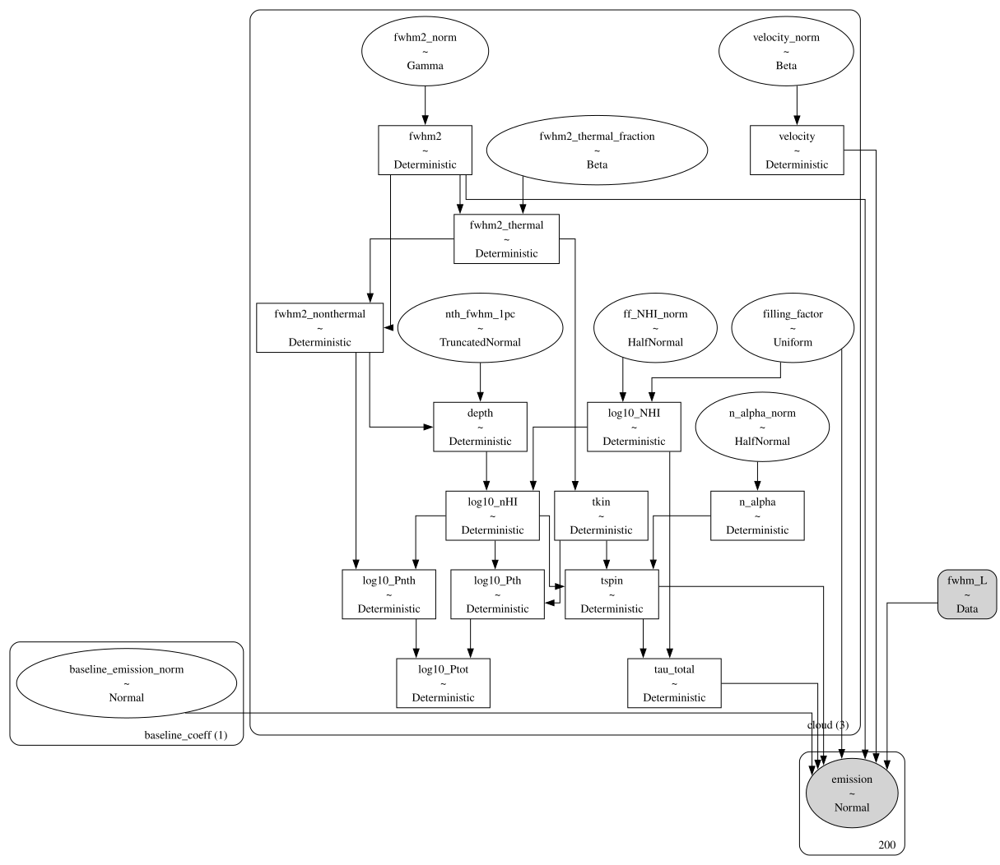

In [8]:
# Plot model graph
model.graph().render('emission_physical_model', format='png')
model.graph()

In [9]:
# model string representation
print(model.model.str_repr())

baseline_emission_norm ~ Normal(0, 1)
            fwhm2_norm ~ Gamma(0.5, f())
         velocity_norm ~ Beta(2, 2)
          n_alpha_norm ~ HalfNormal(0, 1)
          nth_fwhm_1pc ~ TruncatedNormal(1.75, 0.25, 0, inf)
           ff_NHI_norm ~ HalfNormal(0, 1)
fwhm2_thermal_fraction ~ Beta(2, 2)
        filling_factor ~ Uniform(0, 1)
                 fwhm2 ~ Deterministic(f(fwhm2_norm))
              velocity ~ Deterministic(f(velocity_norm))
               n_alpha ~ Deterministic(f(n_alpha_norm))
         fwhm2_thermal ~ Deterministic(f(fwhm2_thermal_fraction, fwhm2_norm))
                  tkin ~ Deterministic(f(fwhm2_thermal_fraction, fwhm2_norm))
      fwhm2_nonthermal ~ Deterministic(f(fwhm2_thermal_fraction, fwhm2_norm))
                 depth ~ Deterministic(f(nth_fwhm_1pc, fwhm2_thermal_fraction, fwhm2_norm))
             log10_NHI ~ Deterministic(f(filling_factor, ff_NHI_norm))
             log10_nHI ~ Deterministic(f(filling_factor, nth_fwhm_1pc, ff_NHI_norm, fwhm2_thermal_fra

Sampling: [baseline_emission_norm, emission, ff_NHI_norm, filling_factor, fwhm2_norm, fwhm2_thermal_fraction, n_alpha_norm, nth_fwhm_1pc, velocity_norm]


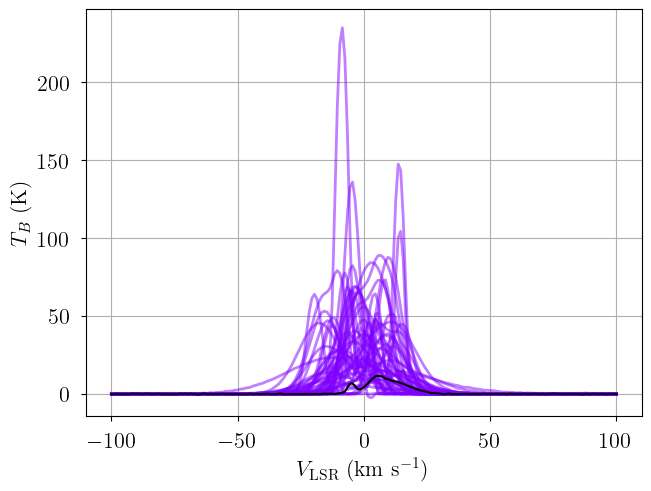

In [10]:
from bayes_spec.plots import plot_predictive

# prior predictive check
prior = model.sample_prior_predictive(
    samples=1000,  # prior predictive samples
)
_ = plot_predictive(model.data, prior.prior_predictive.sel(draw=slice(None, None, 20)))

In [11]:
print(model.cloud_freeRVs)
print(model.cloud_deterministics)

['fwhm2_norm', 'velocity_norm', 'n_alpha_norm', 'nth_fwhm_1pc', 'ff_NHI_norm', 'fwhm2_thermal_fraction', 'filling_factor']
['fwhm2', 'velocity', 'n_alpha', 'fwhm2_thermal', 'tkin', 'fwhm2_nonthermal', 'depth', 'log10_NHI', 'log10_nHI', 'tspin', 'tau_total', 'log10_Pth', 'log10_Pnth', 'log10_Ptot']


['fwhm2', 'velocity', 'n_alpha', 'fwhm2_thermal', 'tkin', 'fwhm2_nonthermal', 'depth', 'log10_NHI', 'log10_nHI', 'tspin', 'tau_total', 'log10_Pth', 'log10_Pnth', 'log10_Ptot', 'nth_fwhm_1pc', 'fwhm2_thermal_fraction', 'filling_factor']


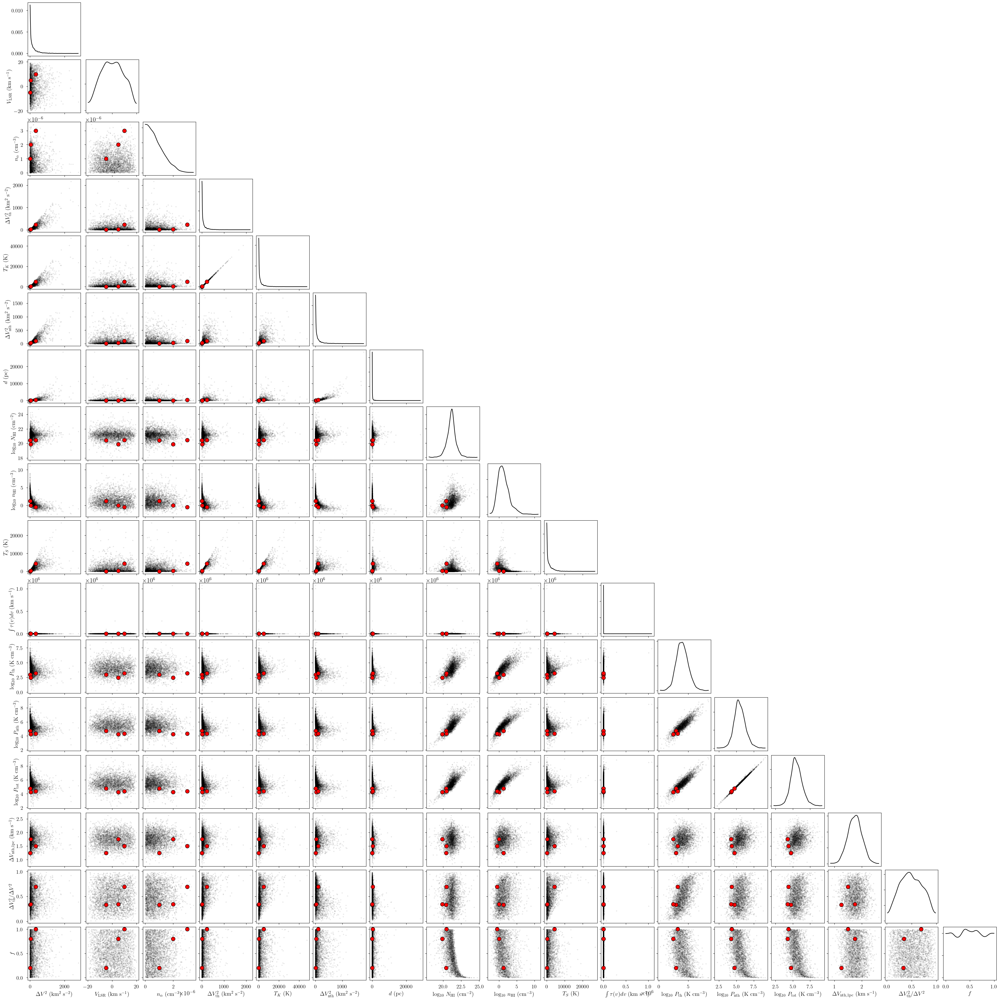

In [12]:
from bayes_spec.plots import plot_pair

var_names = model.cloud_deterministics + [p for p in model.cloud_freeRVs if "_norm" not in p]
print(var_names)
_ = plot_pair(
    prior.prior, # samples
    var_names, # var_names to plot
    combine_dims=["cloud"], # concatenate clouds
    labeller=model.labeller, # label manager
    kind="scatter", # plot type
    reference_values=sim_params, # truths
)

## Variational Inference

In [13]:
start = time.time()
model.fit(
    n = 1_000_000, # maximum number of VI iterations
    draws = 1_000, # number of posterior samples
    rel_tolerance = 0.005, # VI relative convergence threshold
    abs_tolerance = 0.005, # VI absolute convergence threshold
    learning_rate = 0.001, # VI learning rate
    start = {"velocity_norm": np.linspace(0.1, 0.9, model.n_clouds)},
)
end = time.time()
print(f"Runtime: {(end-start)/60.0:.2f} minutes")

Output()

Convergence achieved at 69400
Interrupted at 69,399 [6%]: Average Loss = 83,613


Adding log-likelihood to trace


Output()

Runtime: 1.42 minutes


In [14]:
pm.summary(model.trace.posterior)

arviz - WARNING - Shape validation failed: input_shape: (1, 1000), minimum_shape: (chains=2, draws=4)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
baseline_emission_norm[0],-0.476,0.073,-0.612,-0.339,0.002,0.002,1117.0,850.0,NaN
fwhm2_norm[0],0.046,0.001,0.043,0.049,0.000,0.000,962.0,984.0,NaN
fwhm2_norm[1],0.201,0.005,0.192,0.209,0.000,0.000,1028.0,873.0,NaN
fwhm2_norm[2],1.595,0.012,1.574,1.619,0.000,0.000,962.0,910.0,NaN
velocity_norm[0],0.374,0.001,0.373,0.375,0.000,0.000,976.0,906.0,NaN
velocity_norm[1],0.622,0.001,0.620,0.623,0.000,0.000,957.0,975.0,NaN
velocity_norm[2],0.755,0.001,0.753,0.757,0.000,0.000,1000.0,982.0,NaN
n_alpha_norm[0],0.764,0.669,0.065,1.944,0.022,0.043,980.0,1005.0,NaN
n_alpha_norm[1],0.804,0.714,0.041,1.954,0.022,0.041,996.0,1034.0,NaN
n_alpha_norm[2],0.839,0.798,0.076,2.294,0.027,0.060,880.0,983.0,NaN


Sampling: [emission]


Output()

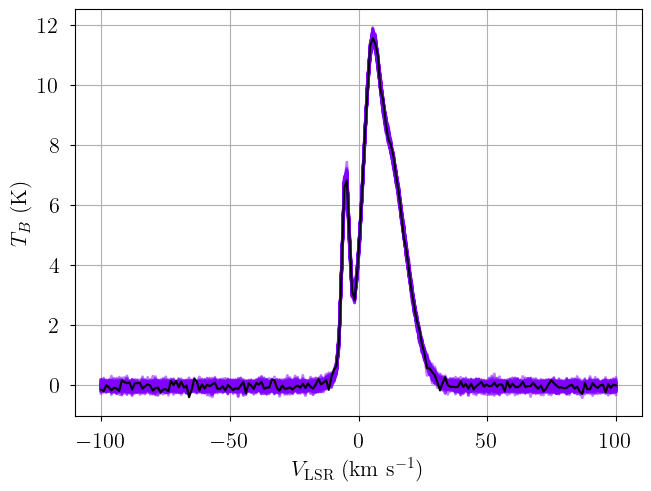

In [15]:
posterior = model.sample_posterior_predictive(
    thin=10, # keep one in {thin} posterior samples
)
_ = plot_predictive(model.data, posterior.posterior_predictive)

## Posterior Sampling: MCMC

In [16]:
start = time.time()
model.sample(
    init="advi+adapt_diag",  # initialization strategy
    tune=1000,  # tuning samples
    draws=1000,  # posterior samples
    chains=8,  # number of independent chains
    cores=8,  # number of parallel chains
    init_kwargs={
        "rel_tolerance": 0.005,
        "abs_tolerance": 0.005,
        "learning_rate": 0.001,
        "start": {"velocity_norm": np.linspace(0.1, 0.9, model.n_clouds)},
    },  # VI initialization arguments
    nuts_kwargs={"target_accept": 0.9},  # NUTS arguments
)
end = time.time()
print(f"Runtime: {(end-start)/60.0:.2f} minutes")

Initializing NUTS using custom advi+adapt_diag strategy


Output()

Convergence achieved at 69400
Interrupted at 69,399 [6%]: Average Loss = 83,613
Multiprocess sampling (8 chains in 8 jobs)
NUTS: [baseline_emission_norm, fwhm2_norm, velocity_norm, n_alpha_norm, nth_fwhm_1pc, ff_NHI_norm, fwhm2_thermal_fraction, filling_factor]


Output()

Sampling 8 chains for 1_000 tune and 1_000 draw iterations (8_000 + 8_000 draws total) took 42 seconds.


Adding log-likelihood to trace


Output()

There were 359 divergences in converged chains.
Runtime: 2.26 minutes


In [17]:
model.solve(
    init_params="random_from_data", # GMM initialization strategy
    n_init=10, # number of GMM initilizations
    max_iter=1_000, # maximum number of GMM iterations
    kl_div_threshold=0.1, # covergence threshold
)

GMM converged to unique solution
7 of 8 chains appear converged.


In [18]:
print("solutions:", model.solutions)
az.summary(model.trace["solution_0"])
# this also works: az.summary(model.trace.solution_0)

solutions: [0]


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
baseline_emission_norm[0],-0.472,0.081,-0.623,-0.327,0.002,0.002,3618.0,2338.0,1.00
fwhm2_norm[0],0.042,0.004,0.034,0.049,0.000,0.000,1319.0,1133.0,1.01
fwhm2_norm[1],0.196,0.014,0.169,0.222,0.000,0.000,1682.0,2177.0,1.00
fwhm2_norm[2],1.597,0.031,1.537,1.652,0.001,0.000,1746.0,2524.0,1.00
velocity_norm[0],0.375,0.001,0.374,0.376,0.000,0.000,4870.0,3966.0,1.00
velocity_norm[1],0.622,0.001,0.619,0.625,0.000,0.000,2333.0,2955.0,1.00
velocity_norm[2],0.754,0.004,0.747,0.761,0.000,0.000,1438.0,2330.0,1.00
n_alpha_norm[0],0.795,0.603,0.001,1.871,0.007,0.008,4563.0,2494.0,1.00
n_alpha_norm[1],0.797,0.601,0.001,1.874,0.008,0.008,3641.0,2618.0,1.00
n_alpha_norm[2],0.815,0.620,0.000,1.942,0.009,0.009,3653.0,2686.0,1.00


Sampling: [emission]


Output()

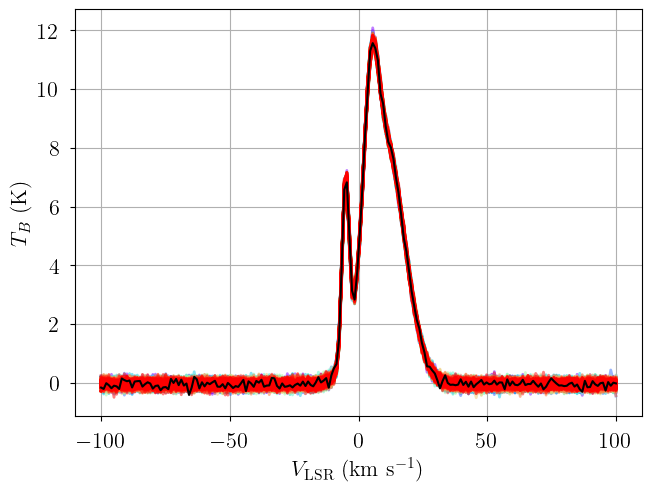

In [19]:
posterior = model.sample_posterior_predictive(
    thin=10, # keep one in {thin} posterior samples
)
_ = plot_predictive(model.data, posterior.posterior_predictive)

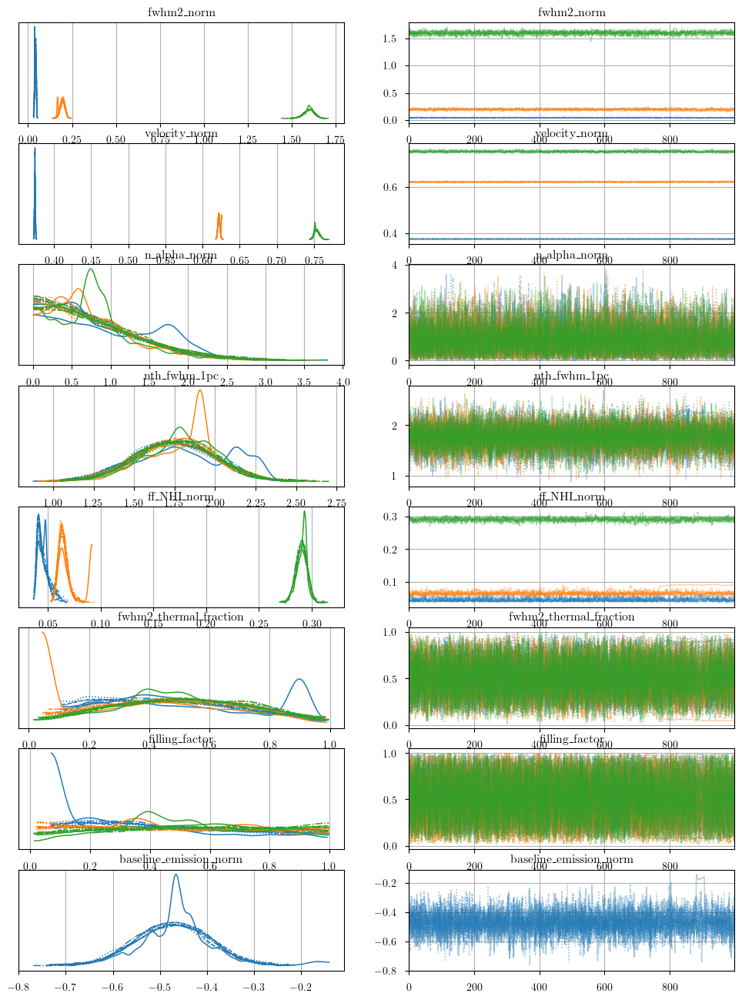

In [20]:
from bayes_spec.plots import plot_traces

_ = plot_traces(model.trace.posterior, model.cloud_freeRVs + model.baseline_freeRVs + model.hyper_freeRVs)

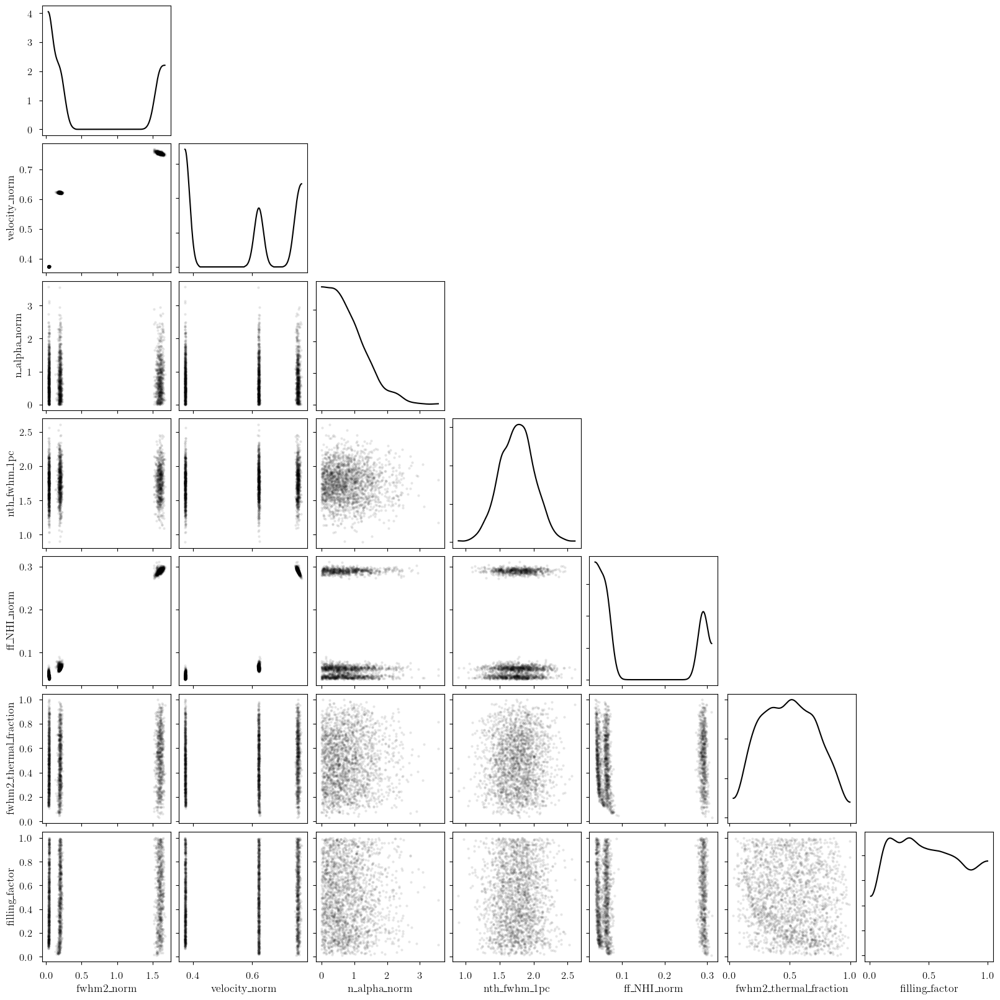

In [21]:
_ = plot_pair(
    model.trace.solution_0.sel(draw=slice(None, None, 10)), # samples
    model.cloud_freeRVs, # var_names to plot
    combine_dims=["cloud"], # concatenate clouds
    kind="scatter", # plot type
)

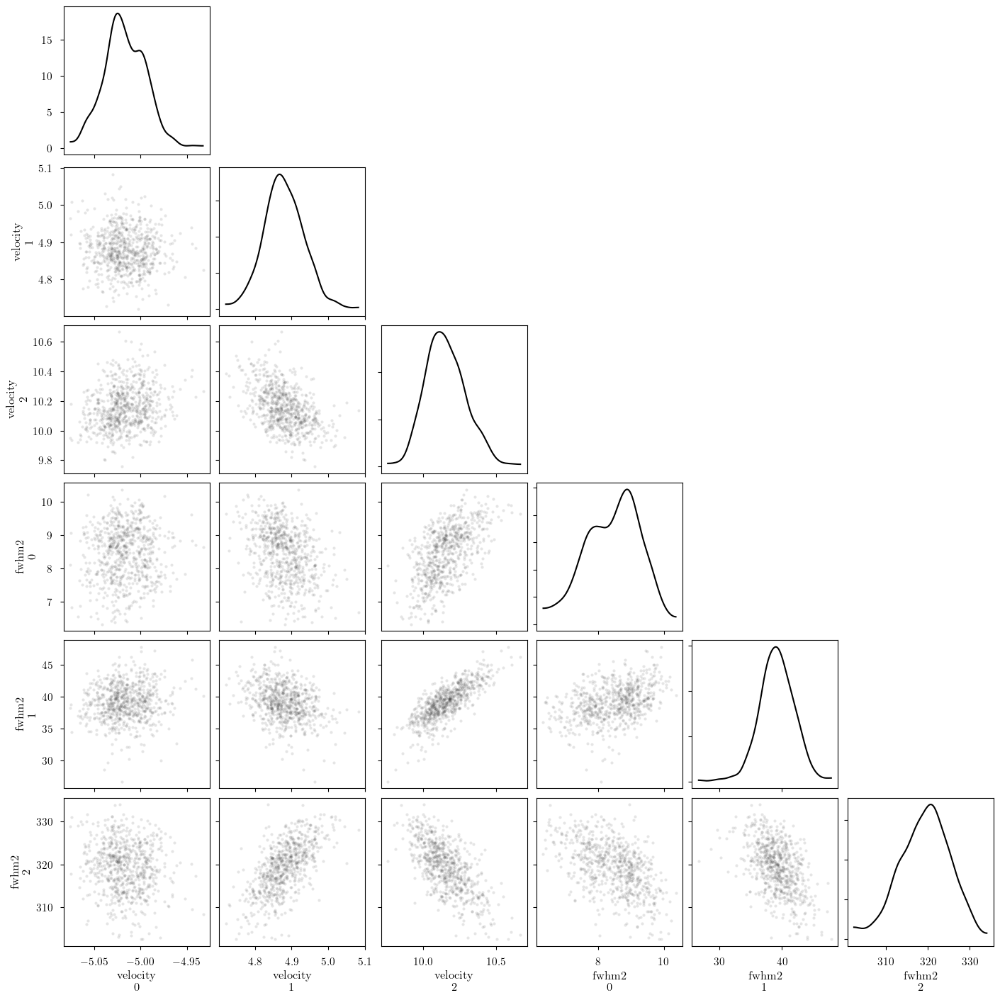

In [22]:
_ = plot_pair(
    model.trace.solution_0.sel(draw=slice(None, None, 10)), # samples
    ["velocity", "fwhm2"], # var_names to plot
    combine_dims=None, # do not concatenate clouds
    kind="scatter", # plot type
)

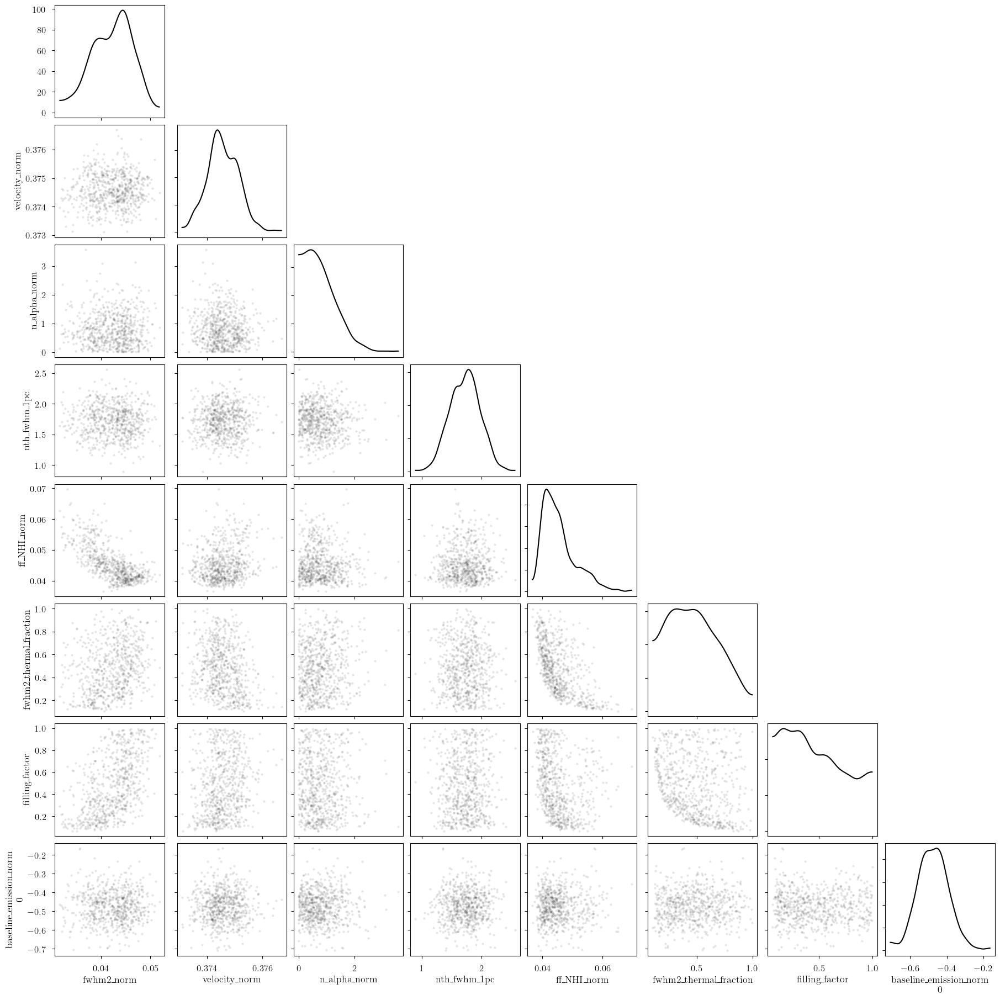

In [23]:
_ = plot_pair(
    model.trace.solution_0.sel(cloud=0, draw=slice(None, None, 10)), # samples
    model.cloud_freeRVs + model.hyper_freeRVs + model.baseline_freeRVs, # var_names to plot
    kind="scatter", # plot type
)

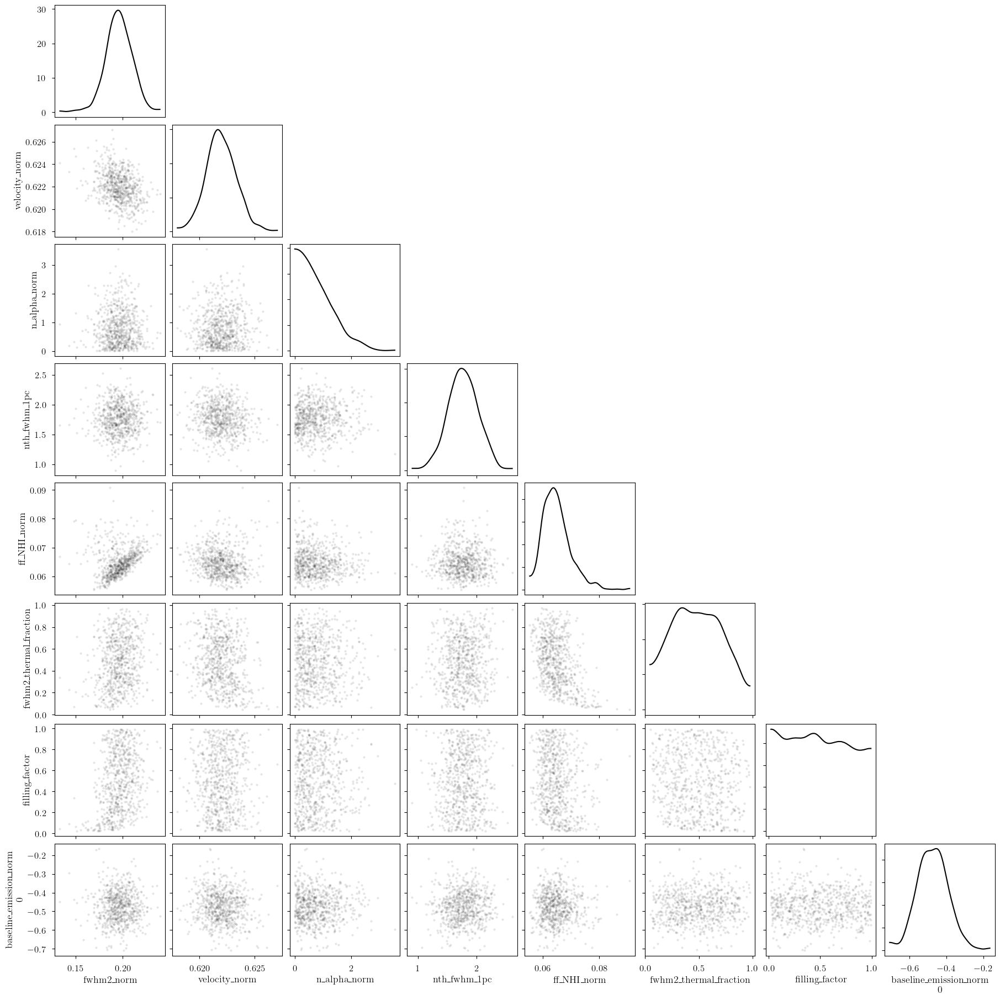

In [24]:
_ = plot_pair(
    model.trace.solution_0.sel(cloud=1, draw=slice(None, None, 10)), # samples
    model.cloud_freeRVs + model.hyper_freeRVs + model.baseline_freeRVs, # var_names to plot
    kind="scatter", # plot type
)

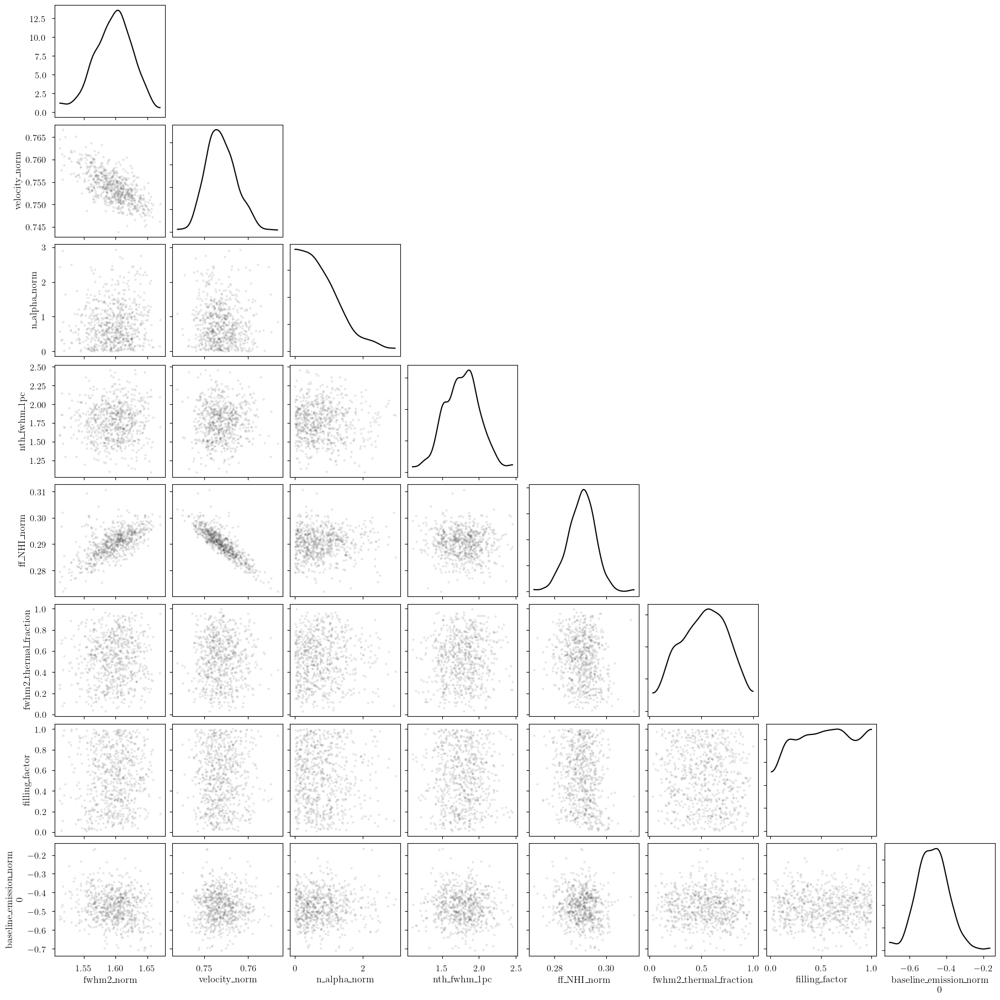

In [25]:
_ = plot_pair(
    model.trace.solution_0.sel(cloud=2, draw=slice(None, None, 10)), # samples
    model.cloud_freeRVs + model.hyper_freeRVs + model.baseline_freeRVs, # var_names to plot
    kind="scatter", # plot type
)

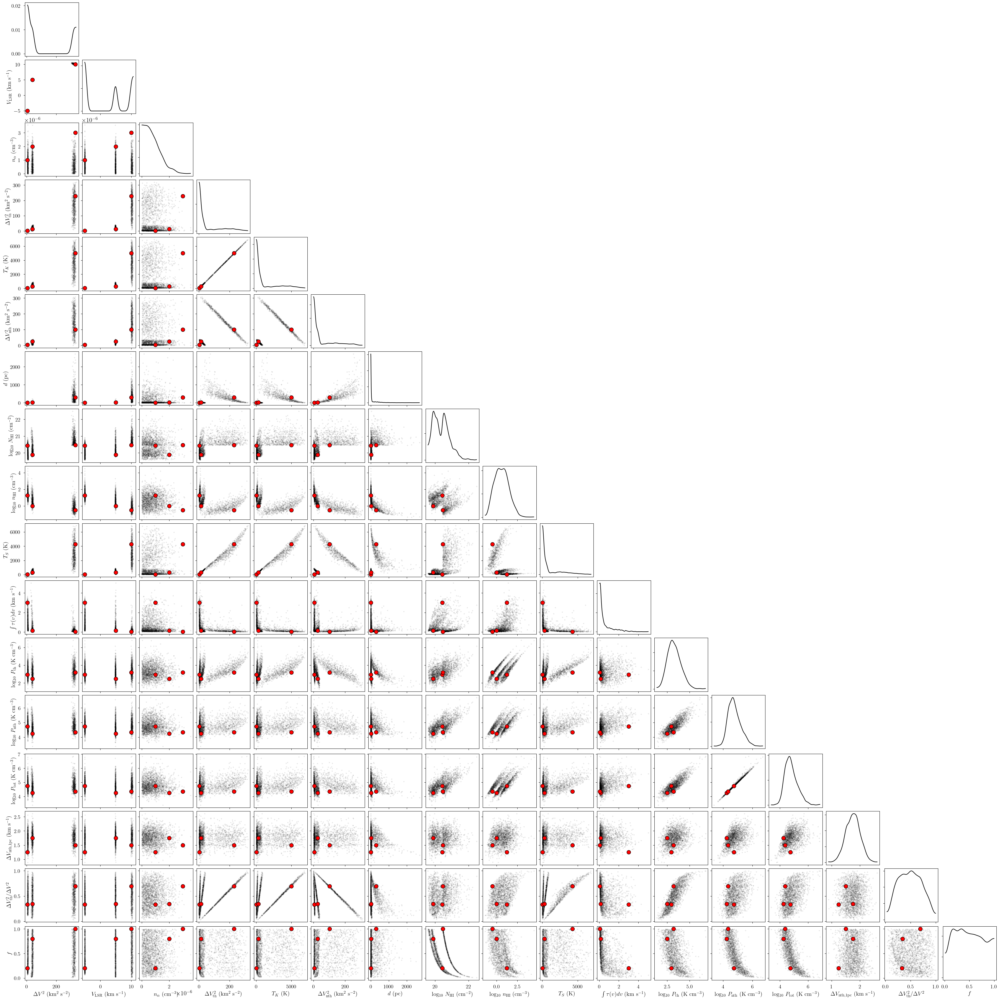

In [26]:
_ = plot_pair(
    model.trace.solution_0.sel(draw=slice(None, None, 10)), # samples
    var_names, # var_names to plot
    combine_dims=["cloud"], # concatenate clouds
    labeller=model.labeller, # label manager
    kind="scatter", # plot type
    reference_values=sim_params, # truths
)

In [27]:
# identify simulation cloud corresponding to each posterior cloud
sim_cloud_map = {}
for i in range(n_clouds):
    posterior_velocity = model.trace.solution_0['velocity'].sel(cloud=i).data.mean()
    match = np.argmin(np.abs(sim_params["velocity"] - posterior_velocity))
    sim_cloud_map[i] = match
sim_cloud_map

{0: np.int64(0), 1: np.int64(1), 2: np.int64(2)}

In [28]:
print("cloud freeRVs", model.cloud_freeRVs)
print("cloud deterministics", model.cloud_deterministics)
print("hyper freeRVs", model.hyper_freeRVs)
print("hyper deterministics", model.hyper_deterministics)

cloud freeRVs ['fwhm2_norm', 'velocity_norm', 'n_alpha_norm', 'nth_fwhm_1pc', 'ff_NHI_norm', 'fwhm2_thermal_fraction', 'filling_factor']
cloud deterministics ['fwhm2', 'velocity', 'n_alpha', 'fwhm2_thermal', 'tkin', 'fwhm2_nonthermal', 'depth', 'log10_NHI', 'log10_nHI', 'tspin', 'tau_total', 'log10_Pth', 'log10_Pnth', 'log10_Ptot']
hyper freeRVs []
hyper deterministics []


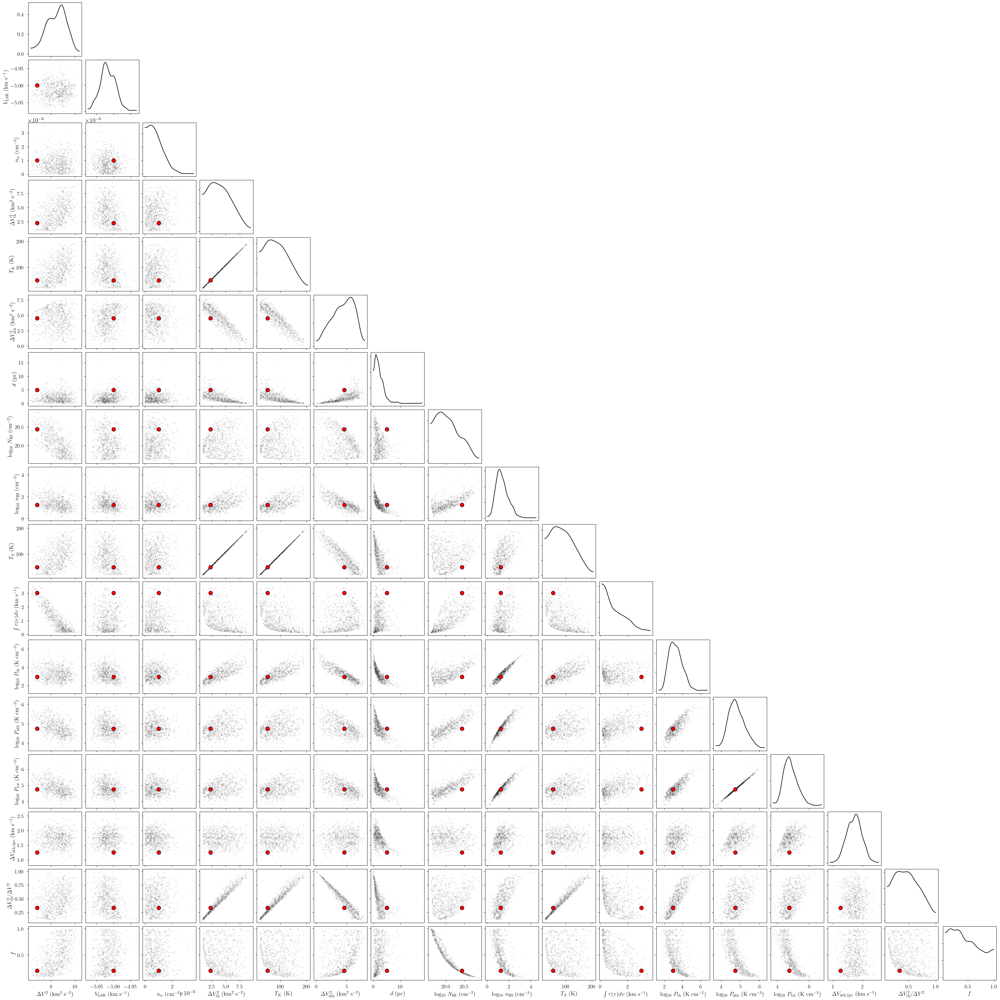

In [29]:
cloud = 0

# subset of sim_params
my_sim_params = {}
for var_name in var_names:
    my_sim_params[var_name] = sim_params[var_name][sim_cloud_map[cloud]]

_ = plot_pair(
    model.trace.solution_0.sel(cloud=cloud, draw=slice(None, None, 10)), # samples
    var_names, # var_names to plot
    labeller=model.labeller, # label manager
    kind="scatter", # plot type
    reference_values=my_sim_params, # truths
)

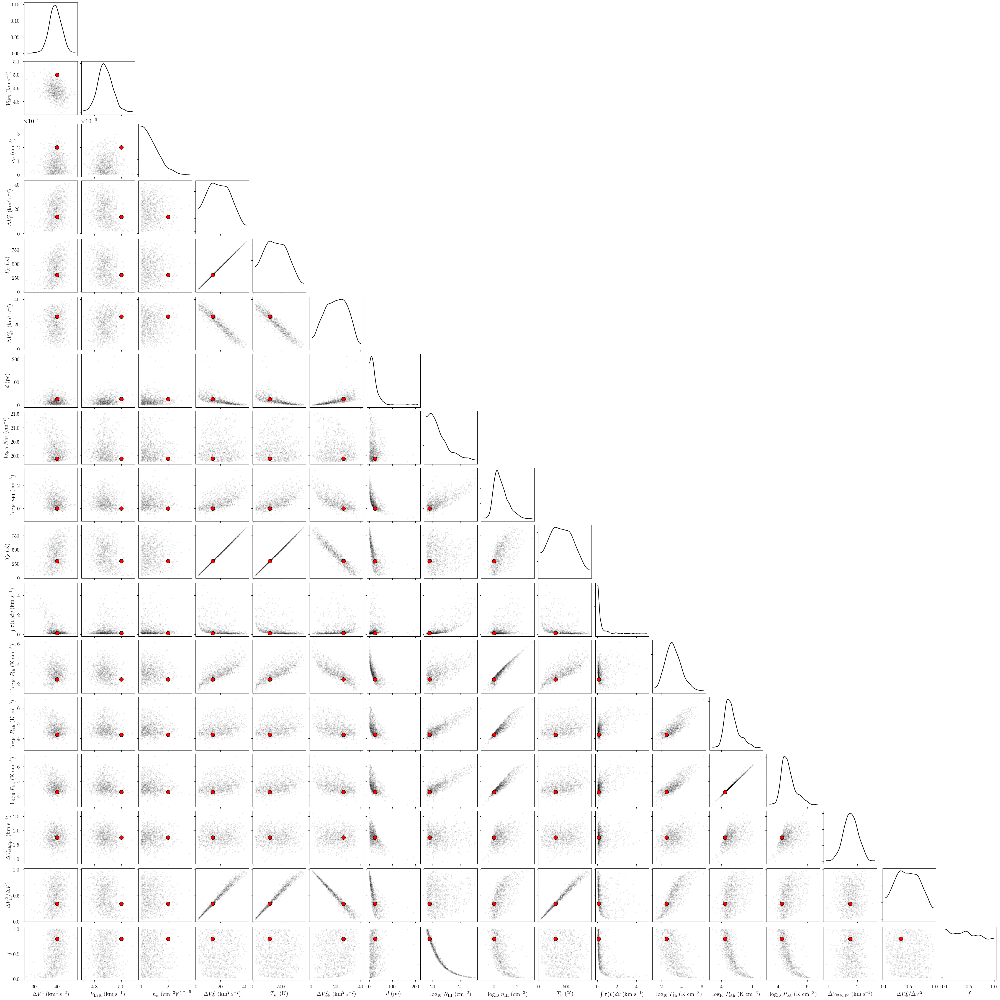

In [30]:
cloud = 1

# subset of sim_params
my_sim_params = {}
for var_name in var_names:
    my_sim_params[var_name] = sim_params[var_name][sim_cloud_map[cloud]]

_ = plot_pair(
    model.trace.solution_0.sel(cloud=cloud, draw=slice(None, None, 10)), # samples
    var_names, # var_names to plot
    labeller=model.labeller, # label manager
    kind="scatter", # plot type
    reference_values=my_sim_params, # truths
)

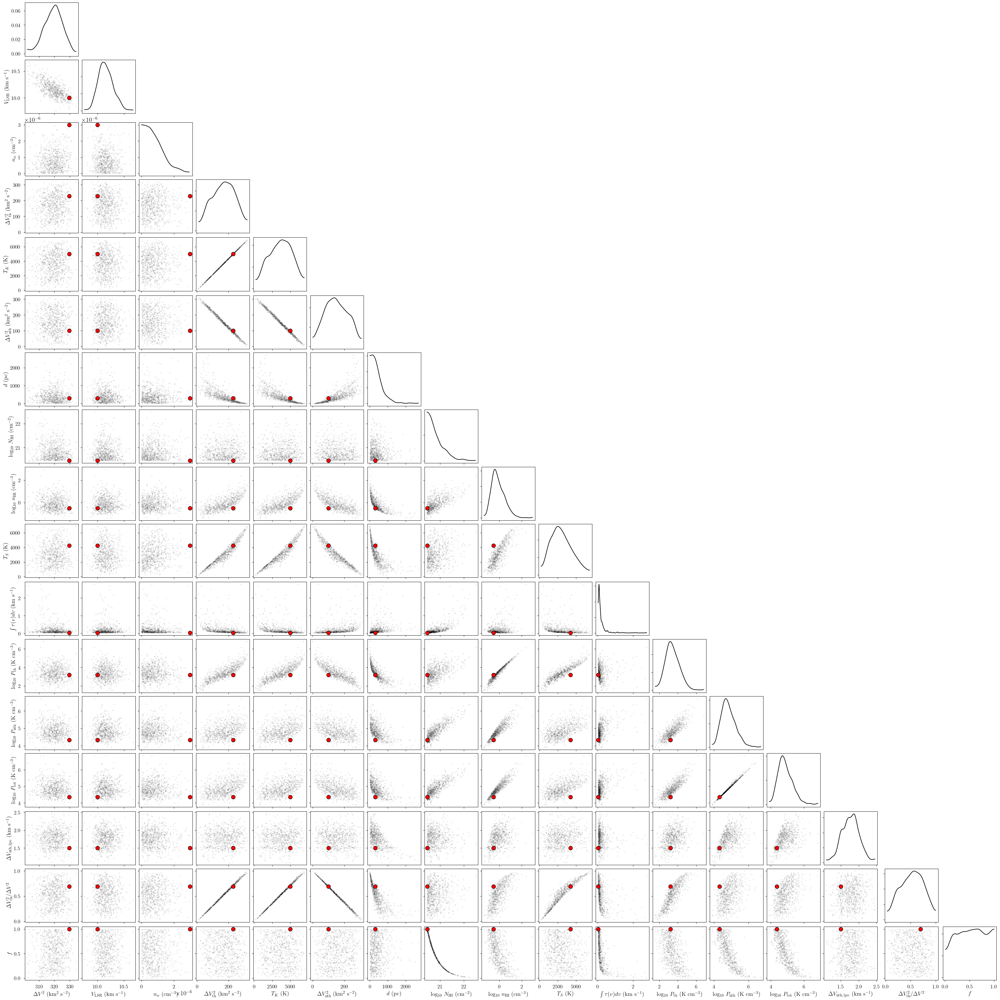

In [31]:
cloud = 2

# subset of sim_params
my_sim_params = {}
for var_name in var_names:
    my_sim_params[var_name] = sim_params[var_name][sim_cloud_map[cloud]]

_ = plot_pair(
    model.trace.solution_0.sel(cloud=cloud, draw=slice(None, None, 10)), # samples
    var_names, # var_names to plot
    labeller=model.labeller, # label manager
    kind="scatter", # plot type
    reference_values=my_sim_params, # truths
)

In [32]:
point_stats = az.summary(model.trace.solution_0, kind='stats')
print("BIC:", model.bic())
display(point_stats)

BIC: -189.98237728271457


,mean,sd,hdi_3%,hdi_97%
baseline_emission_norm[0],-0.472,0.081,-0.623,-0.327
fwhm2_norm[0],0.042,0.004,0.034,0.049
fwhm2_norm[1],0.196,0.014,0.169,0.222
fwhm2_norm[2],1.597,0.031,1.537,1.652
velocity_norm[0],0.375,0.001,0.374,0.376
velocity_norm[1],0.622,0.001,0.619,0.625
velocity_norm[2],0.754,0.004,0.747,0.761
n_alpha_norm[0],0.795,0.603,0.001,1.871
n_alpha_norm[1],0.797,0.601,0.001,1.874
n_alpha_norm[2],0.815,0.620,0.000,1.942
